In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns 
from scipy import stats

from sklearn.linear_model import LinearRegression 
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, LassoCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, cross_val_score


import xgboost as xgb
from xgboost.sklearn import XGBRegressor

import xgboost as xg 
from sklearn.ensemble import RandomForestRegressor
from sklearn import svm
from sklearn.linear_model import LinearRegression
# Feature Importance 
import shap

In [2]:
pisa2018_thailand = pd.read_csv('datasets/pisa2018_thailand.csv')

In [3]:
pisa2018_thailand.head()

,CNTRYID,CNTSCHID,CNTSTUID,STRATUM,EFFORT1,EFFORT2,OCOD1,OCOD2,OCOD3,GRADE,...,UNIT,WVARSTRR,SENWT,VER_DAT,test,GENDER,MATH,SCIENCE,READ,TOTALSCORE
0,Thailand,76400001.0,76400028.0,Undisclosed STRATUM - Thailand,10.0,6.0,Housewife,Retail and wholesale trade managers,Applications programmers,0.0,...,final variance unit 2,7.0,0.04674,30APR19:15:04:17,NaN,1,606.0296,515.3353,477.3303,532.898400
1,Thailand,76400001.0,76400053.0,Undisclosed STRATUM - Thailand,9.0,8.0,Cooks,Sales and marketing managers,Missing,0.0,...,final variance unit 2,64.0,0.04674,30APR19:15:04:17,NaN,1,562.2686,508.3563,514.8449,528.489933
2,Thailand,76400001.0,76400266.0,Undisclosed STRATUM - Thailand,10.0,10.0,Bank tellers and related clerks,Retail and wholesale trade managers,Retail and wholesale trade managers,0.0,...,final variance unit 2,2.0,0.04674,30APR19:15:04:17,NaN,1,500.9725,504.6400,467.6045,491.072333
3,Thailand,76400001.0,76400751.0,Undisclosed STRATUM - Thailand,9.0,10.0,Accountants,Police officers,Generalist medical practitioners,0.0,...,final variance unit 1,64.0,0.04674,30APR19:15:04:17,NaN,1,509.4624,517.7330,484.8153,504.003567
4,Thailand,76400001.0,76401297.0,Undisclosed STRATUM - Thailand,8.0,10.0,Housewife,Police officers,Engineering professionals not elsewhere classi...,0.0,...,final variance unit 1,30.0,0.04487,30APR19:15:04:17,NaN,0,586.2431,587.1336,535.4648,569.613833


In [4]:
schl_info= pd.read_excel('datasets/Codes_merge_2018.xlsx')
schl_info.head()

,CNTSCHID,Dept,Region
0,76400001.0,6,5
1,76400002.0,7,8
2,76400003.0,2,2
3,76400004.0,5,9
4,76400005.0,2,1


In [5]:
#merge two database by matched "CNTSCHID"
pisa2018_thailand = pisa2018_thailand.merge(schl_info, how='left', on='CNTSCHID')

In [6]:
pisa2018_thailand.head()

,CNTRYID,CNTSCHID,CNTSTUID,STRATUM,EFFORT1,EFFORT2,OCOD1,OCOD2,OCOD3,GRADE,...,SENWT,VER_DAT,test,GENDER,MATH,SCIENCE,READ,TOTALSCORE,Dept,Region
0,Thailand,76400001.0,76400028.0,Undisclosed STRATUM - Thailand,10.0,6.0,Housewife,Retail and wholesale trade managers,Applications programmers,0.0,...,0.04674,30APR19:15:04:17,NaN,1,606.0296,515.3353,477.3303,532.898400,6,5
1,Thailand,76400001.0,76400053.0,Undisclosed STRATUM - Thailand,9.0,8.0,Cooks,Sales and marketing managers,Missing,0.0,...,0.04674,30APR19:15:04:17,NaN,1,562.2686,508.3563,514.8449,528.489933,6,5
2,Thailand,76400001.0,76400266.0,Undisclosed STRATUM - Thailand,10.0,10.0,Bank tellers and related clerks,Retail and wholesale trade managers,Retail and wholesale trade managers,0.0,...,0.04674,30APR19:15:04:17,NaN,1,500.9725,504.6400,467.6045,491.072333,6,5
3,Thailand,76400001.0,76400751.0,Undisclosed STRATUM - Thailand,9.0,10.0,Accountants,Police officers,Generalist medical practitioners,0.0,...,0.04674,30APR19:15:04:17,NaN,1,509.4624,517.7330,484.8153,504.003567,6,5
4,Thailand,76400001.0,76401297.0,Undisclosed STRATUM - Thailand,8.0,10.0,Housewife,Police officers,Engineering professionals not elsewhere classi...,0.0,...,0.04487,30APR19:15:04:17,NaN,0,586.2431,587.1336,535.4648,569.613833,6,5


In [7]:
pisa2018_thailand_extra = pd.read_csv('datasets/PISA2018_THA_Datafile_extra.csv')

In [8]:
pisa2018_thailand_extra.head(5)

,CNTSTUID,SCHLTYPE,STRATIO,SCHSIZE,RATCMP1,RATCMP2,TOTAT,PROATCE,PROAT5AB,PROAT5AM,PROAT6,CLSIZE,CREACTIV,EDUSHORT,STAFFSHORT,STUBEHA,TEACHBEHA,SCMCEG
0,76400028,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542
1,76400053,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542
2,76400266,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542
3,76400751,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542
4,76401297,3,29.9111,1346,0.4878,999.0,45.0,0.7222,0.0556,0.8778,0.0667,43,3,0.8006,1.0815,-0.0384,0.2266,-1.0542


In [9]:
pisa2018_thailand_extra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8633 entries, 0 to 8632
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   CNTSTUID    8633 non-null   int64  
 1   SCHLTYPE    8633 non-null   int64  
 2   STRATIO     8633 non-null   float64
 3   SCHSIZE     8633 non-null   int64  
 4   RATCMP1     8633 non-null   float64
 5   RATCMP2     8633 non-null   float64
 6   TOTAT       8633 non-null   float64
 7   PROATCE     8633 non-null   float64
 8   PROAT5AB    8633 non-null   float64
 9   PROAT5AM    8633 non-null   float64
 10  PROAT6      8633 non-null   float64
 11  CLSIZE      8633 non-null   int64  
 12  CREACTIV    8633 non-null   int64  
 13  EDUSHORT    8633 non-null   float64
 14  STAFFSHORT  8633 non-null   float64
 15  STUBEHA     8633 non-null   float64
 16  TEACHBEHA   8633 non-null   float64
 17  SCMCEG      8633 non-null   float64
dtypes: float64(13), int64(5)
memory usage: 1.2 MB


In [10]:
pisa2018_thailand_extra.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
CNTSTUID,8633.0,76404562.18,2627.40,76400001.00,76402292.00,76404562.00,76406837.00,76409120.00
SCHLTYPE,8633.0,2.81,0.53,1.00,3.00,3.00,3.00,3.00
STRATIO,8633.0,35.76,129.17,1.00,14.69,18.14,21.02,999.00
SCHSIZE,8633.0,1762373.04,13152287.02,3.00,718.00,1405.00,2560.00,99999999.00
RATCMP1,8633.0,26.93,160.47,0.01,0.21,0.33,0.56,999.00
RATCMP2,8633.0,56.21,228.27,0.00,1.00,1.00,1.00,999.00
TOTAT,8633.0,106.77,231.89,0.00,44.00,76.50,130.00,3334.50
PROATCE,8633.0,0.88,0.24,0.00,0.90,0.98,1.00,1.00
PROAT5AB,8633.0,0.63,0.23,0.00,0.49,0.64,0.79,1.00
PROAT5AM,8633.0,0.36,0.19,0.00,0.22,0.36,0.49,0.88


In [11]:
#According summary of simple statistic, the database represents missing values as 9, 99, 999, 9999, or 9999999. 
#I will replace these number as NAN. df.applymap(lambda x: np.nan if x == '?' else x)
pisa2018_thailand_extra= pisa2018_thailand_extra.replace('', np.nan)
for col in pisa2018_thailand_extra.columns:
    if pisa2018_thailand_extra[col].max() == 9:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 9 else x)
    elif pisa2018_thailand_extra[col].max() == 99:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 99 else x)
    elif pisa2018_thailand_extra[col].max() == 999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 999 else x)
    elif pisa2018_thailand_extra[col].max() == 9999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 9999 else x)
    elif pisa2018_thailand_extra[col].max() == 99999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 99999 else x)
    elif pisa2018_thailand_extra[col].max() == 999999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 999999 else x)
    elif pisa2018_thailand_extra[col].max() == 9999999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 9999999 else x)
    elif pisa2018_thailand_extra[col].max() == 99999999:
        pisa2018_thailand_extra[col] = pisa2018_thailand_extra[col].apply(lambda x: np.nan if x == 99999999 else x)

In [12]:
pisa2018_thailand = pisa2018_thailand.merge(pisa2018_thailand_extra, how='left', on='CNTSTUID')

In [13]:
pisa2018_thailand.shape

(8633, 148)

In [14]:
pisa2018_thailand.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8633 entries, 0 to 8632
Columns: 148 entries, CNTRYID to SCMCEG
dtypes: float64(112), int64(6), object(30)
memory usage: 9.8+ MB


In [15]:
pisa2018_thailand.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
CNTSCHID,8633.0,76400151.01,82.92,76400001.00,76400082.00,76400153.00,76400222.00,76400291.00
CNTSTUID,8633.0,76404562.18,2627.40,76400001.00,76402292.00,76404562.00,76406837.00,76409120.00
EFFORT1,7255.0,8.62,1.51,1.00,8.00,9.00,10.00,10.00
EFFORT2,7209.0,9.09,1.38,1.00,9.00,10.00,10.00,10.00
GRADE,8633.0,-0.20,0.49,-3.00,0.00,0.00,0.00,1.00
...,...,...,...,...,...,...,...,...
EDUSHORT,8633.0,0.29,1.11,-1.42,-0.63,0.43,1.03,2.96
STAFFSHORT,8633.0,-0.02,1.11,-1.46,-0.78,-0.09,0.82,4.04
STUBEHA,8633.0,-0.39,1.04,-3.38,-0.95,-0.34,0.18,1.77
TEACHBEHA,8633.0,-0.52,1.03,-2.04,-1.42,-0.51,0.23,1.72


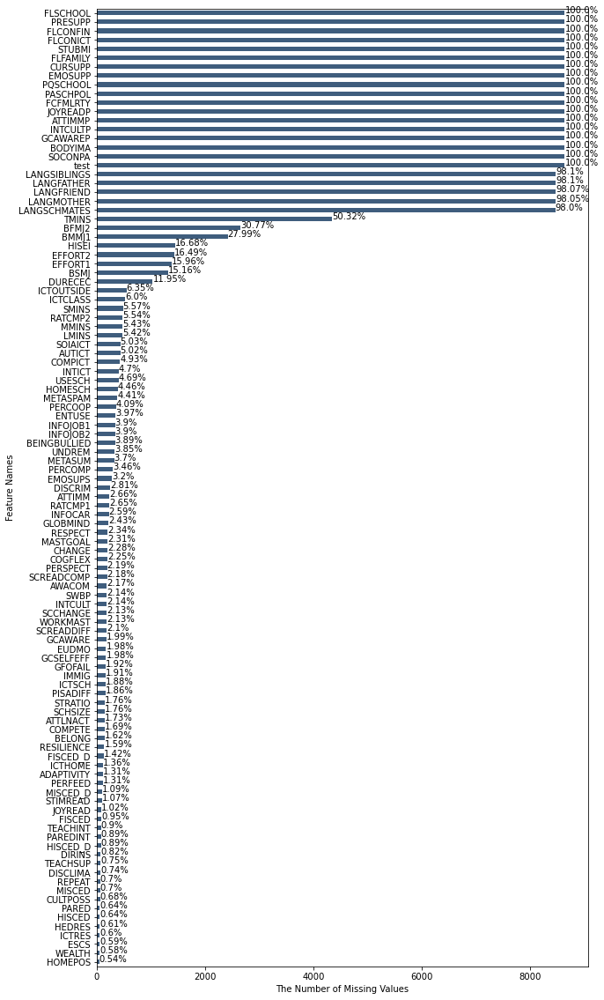

In [16]:
#Checking percentage of null values

Nan = pisa2018_thailand.isnull().sum()[pisa2018_thailand.isnull().sum()>0]

Nan.sort_values().plot(kind='barh', figsize=(10, 20), color = "#3F5D7D");

for y, x in enumerate(Nan.sort_values()):
    
    plt.annotate(str(round(x/pisa2018_thailand.shape[0]*100,2))+'%', xy=(x, y), size=10)
    
plt.xlabel('The Number of Missing Values')

plt.ylabel('Feature Names');

In [17]:
#Drop column with NAN more than 10%
NanPer = len(pisa2018_thailand) *.90
pisa2018_thailand = pisa2018_thailand.dropna(thresh=NanPer, axis=1)

In [18]:
#split data into train and test
train_thailand , test_thailand  = train_test_split(pisa2018_thailand, test_size=0.2, random_state=42)

print(f"No. of training examples: {train_thailand.shape[0]}")
print(f"No. of testing examples: {test_thailand.shape[0]}")

No. of training examples: 6906
No. of testing examples: 1727


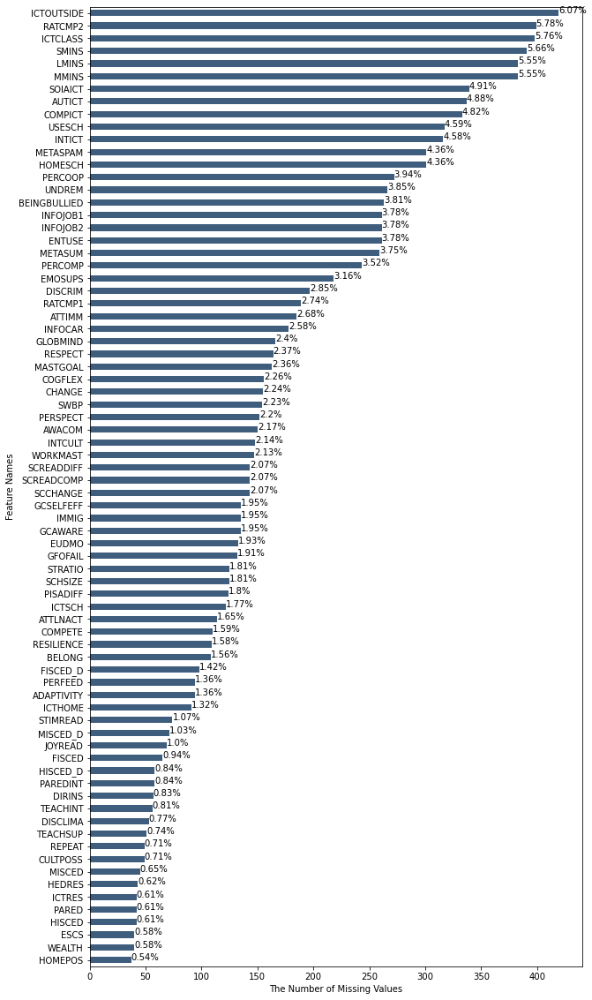

In [19]:
#Checking percentage of null values

Nan = train_thailand.isnull().sum()[train_thailand.isnull().sum()>0]

Nan.sort_values().plot(kind='barh', figsize=(10, 20), color = "#3F5D7D");

for y, x in enumerate(Nan.sort_values()):
    
    plt.annotate(str(round(x/train_thailand.shape[0]*100,2))+'%', xy=(x, y), size=10)
    
plt.xlabel('The Number of Missing Values')

plt.ylabel('Feature Names');

In [20]:
train_thailand['GENDER'] = train_thailand['GENDER'].astype('object')
train_thailand['Dept'] = train_thailand['Dept'].astype('object')
train_thailand['Region'] = train_thailand['Region'].astype('object')
train_thailand['SCHLTYPE'] = train_thailand['SCHLTYPE'].astype('object')

In [21]:
test_thailand['GENDER'] = test_thailand['GENDER'].astype('object')
test_thailand['Dept'] = test_thailand['Dept'].astype('object')
test_thailand['Region'] = test_thailand['Region'].astype('object')
test_thailand['SCHLTYPE'] = test_thailand['SCHLTYPE'].astype('object')

In [22]:
#Fill NAN values with train columns' median
numvar = train_thailand.dtypes !="object"
numeric_features = list(numvar[numvar].index)
for col in numeric_features:
    train_thailand[col].fillna(train_thailand[col].median(), inplace=True)
    test_thailand[col].fillna(train_thailand[col].median(), inplace=True)

In [23]:
#Fill NAN values with train columns' mode
obvar = train_thailand.dtypes =="object"
categorical_features = list(obvar[obvar].index)
for col in categorical_features:
    train_thailand[col].fillna(train_thailand[col].mode()[0], inplace=True)
    test_thailand[col].fillna(train_thailand[col].mode()[0], inplace=True)

In [24]:
categorical_features

['CNTRYID',
 'STRATUM',
 'OCOD1',
 'OCOD2',
 'OCOD3',
 'PROGN',
 'COBN_S',
 'COBN_M',
 'COBN_F',
 'LANGN',
 'ISCEDL',
 'ISCEDD',
 'ISCEDO',
 'MISCED',
 'FISCED',
 'HISCED',
 'MISCED_D',
 'FISCED_D',
 'HISCED_D',
 'IMMIG',
 'REPEAT',
 'SCCHANGE',
 'UNIT',
 'VER_DAT',
 'GENDER',
 'Dept',
 'Region',
 'SCHLTYPE']

In [25]:
train_thailand.isnull().sum().sum(),test_thailand.isnull().sum().sum()

(0, 0)

In [26]:
list(train_thailand.columns)

['CNTRYID',
 'CNTSCHID',
 'CNTSTUID',
 'STRATUM',
 'OCOD1',
 'OCOD2',
 'OCOD3',
 'GRADE',
 'AGE',
 'PROGN',
 'COBN_S',
 'COBN_M',
 'COBN_F',
 'LANGN',
 'ISCEDL',
 'ISCEDD',
 'ISCEDO',
 'MISCED',
 'FISCED',
 'HISCED',
 'PARED',
 'MISCED_D',
 'FISCED_D',
 'HISCED_D',
 'PAREDINT',
 'IMMIG',
 'REPEAT',
 'MMINS',
 'LMINS',
 'SMINS',
 'SCCHANGE',
 'CHANGE',
 'ESCS',
 'UNDREM',
 'METASUM',
 'METASPAM',
 'ICTHOME',
 'ICTSCH',
 'HOMEPOS',
 'CULTPOSS',
 'HEDRES',
 'WEALTH',
 'ICTRES',
 'DISCLIMA',
 'TEACHSUP',
 'DIRINS',
 'PERFEED',
 'EMOSUPS',
 'STIMREAD',
 'ADAPTIVITY',
 'TEACHINT',
 'JOYREAD',
 'SCREADCOMP',
 'SCREADDIFF',
 'PISADIFF',
 'PERCOMP',
 'PERCOOP',
 'ATTLNACT',
 'COMPETE',
 'WORKMAST',
 'GFOFAIL',
 'EUDMO',
 'SWBP',
 'RESILIENCE',
 'MASTGOAL',
 'GCSELFEFF',
 'GCAWARE',
 'ATTIMM',
 'INTCULT',
 'PERSPECT',
 'COGFLEX',
 'RESPECT',
 'AWACOM',
 'GLOBMIND',
 'DISCRIM',
 'BELONG',
 'BEINGBULLIED',
 'ENTUSE',
 'HOMESCH',
 'USESCH',
 'INTICT',
 'COMPICT',
 'AUTICT',
 'SOIAICT',
 'ICTCLASS',

In [27]:
train_thailand.set_index('CNTSTUID', inplace=True)
test_thailand.set_index('CNTSTUID', inplace=True)

In [28]:
train_thailand.drop(columns=['CNTRYID','CNTSCHID','STRATUM','OCOD1','OCOD2','OCOD3','PROGN','COBN_S',
                                'COBN_M','COBN_F','LANGN','UNIT', 'VER_DAT', 'SENWT'], axis =1, inplace = True)
test_thailand.drop(columns=['CNTRYID','CNTSCHID','STRATUM','OCOD1','OCOD2','OCOD3','PROGN','COBN_S',
                                'COBN_M','COBN_F','LANGN','UNIT', 'VER_DAT', 'SENWT'], axis =1, inplace = True)

In [29]:
train_thailand.shape, test_thailand.shape

((6906, 102), (1727, 102))

In [30]:
obvar = train_thailand.dtypes =="object"
categorical_features = list(obvar[obvar].index)
categorical_features

['ISCEDL',
 'ISCEDD',
 'ISCEDO',
 'MISCED',
 'FISCED',
 'HISCED',
 'MISCED_D',
 'FISCED_D',
 'HISCED_D',
 'IMMIG',
 'REPEAT',
 'SCCHANGE']

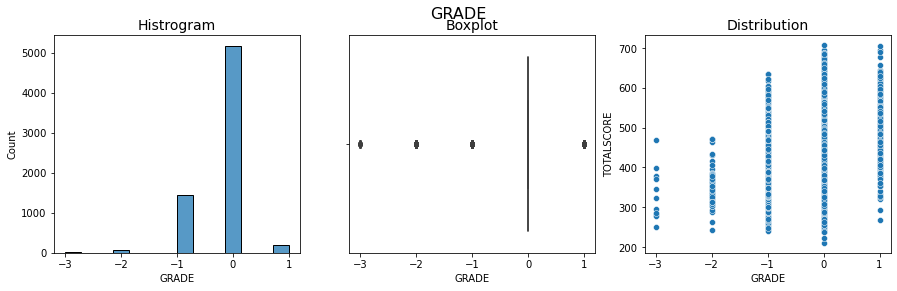

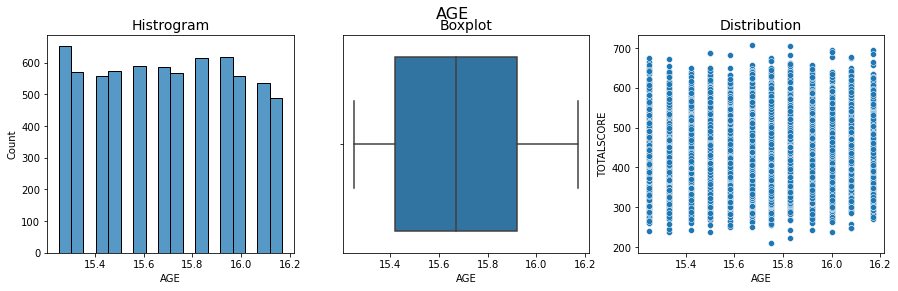

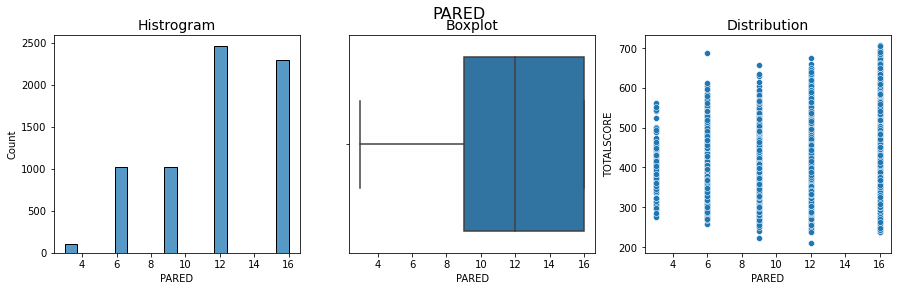

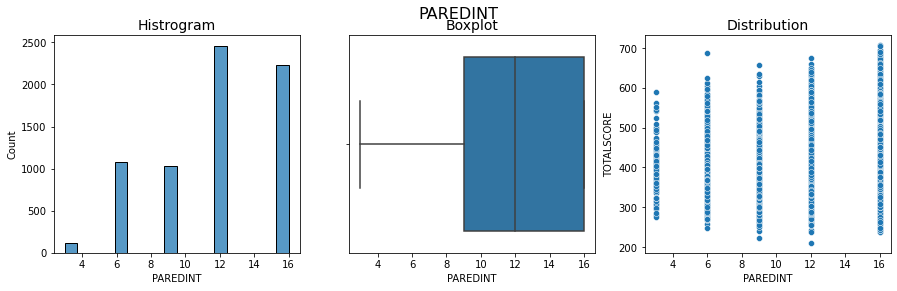

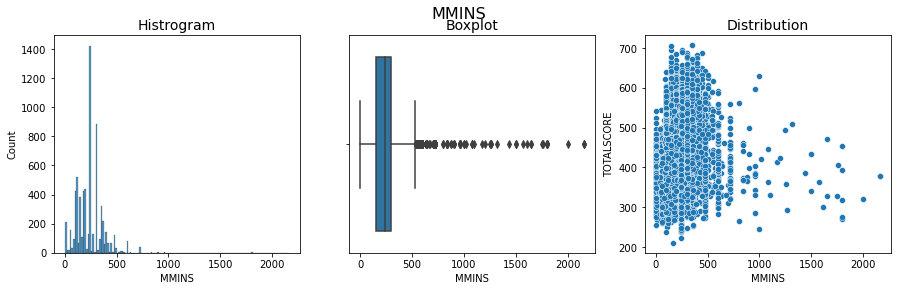

...

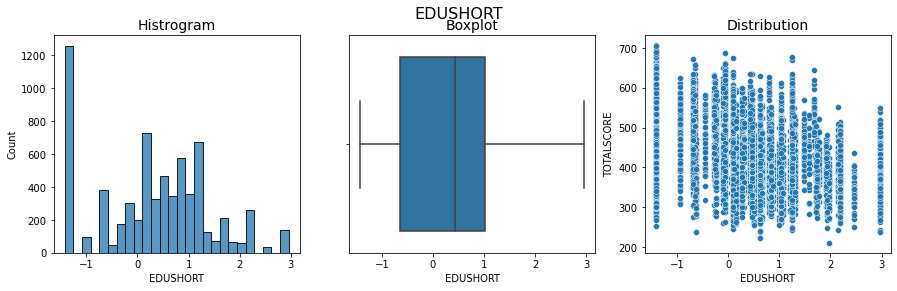

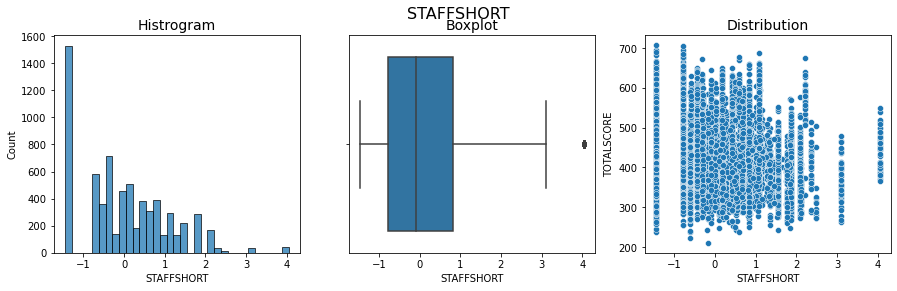

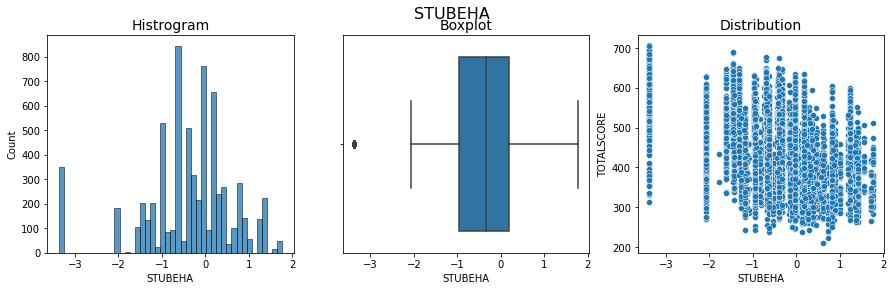

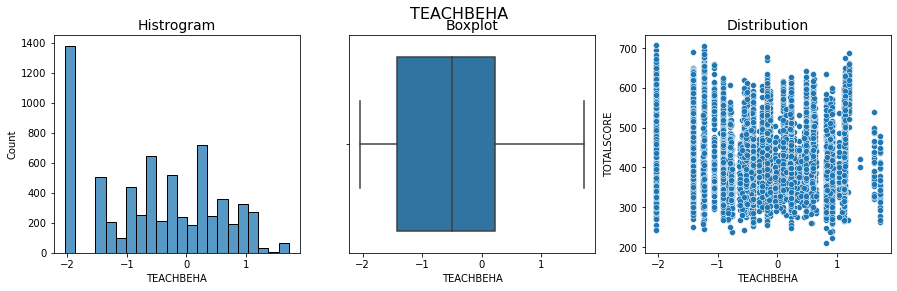

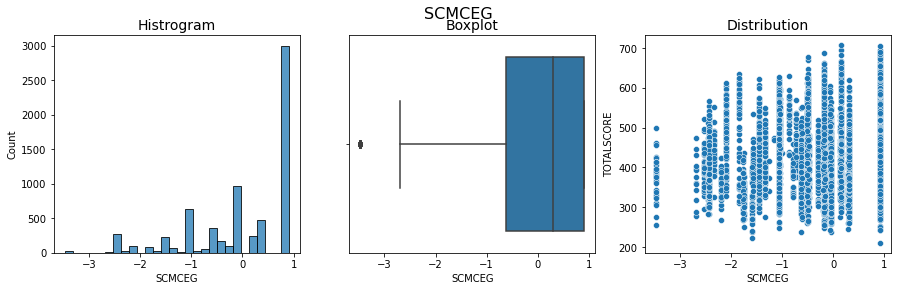

In [31]:
numvar = train_thailand.dtypes !="object"
numeric_features = list(numvar[numvar].index)
for col in numeric_features:
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,4))
    ax = ax.ravel() 
    fig.suptitle(f"{col}\n", fontsize=16)
    ax[0].set_title(f'Histrogram', fontsize =14)
    sns.histplot(train_thailand[col], ax=ax[0])
    ax[1].set_title(f'Boxplot', fontsize =14)
    sns.boxplot(x=train_thailand[col], ax=ax[1])
    ax[2].set_title(f'Distribution', fontsize =14)
    sns.scatterplot(x = train_thailand[col], y= train_thailand['TOTALSCORE'],ax=ax[2])
    plt.show()

In [32]:
#remove extreme outliers
train_thailand = train_thailand[(train_thailand['MMINS'] < 2000)]
train_thailand = train_thailand[(train_thailand['LMINS'] < 2000)]
train_thailand = train_thailand[(train_thailand['SMINS'] < 2000)]
train_thailand = train_thailand[(train_thailand['CHANGE'] < 6)]
train_thailand = train_thailand[(train_thailand['CHANGE'] > -4)]
train_thailand = train_thailand[(train_thailand['HOMEPOS'] > -6)]
train_thailand = train_thailand[(train_thailand['TEACHSUP'] > -3)]
train_thailand = train_thailand[(train_thailand['JOYREAD'] > -2)]
train_thailand = train_thailand[(train_thailand['PERSPECT'] > -3)]
train_thailand = train_thailand[(train_thailand['TOTAT'] < 1000)]

In [33]:
train_thailand.shape, test_thailand.shape

((6775, 102), (1727, 102))

In [34]:
# Creating a function to plot boxplot

def subplot_boxplot(dataframe, list_of_columns):
    
    nrows = int(np.ceil(len(list_of_columns)/2)) 
    
    fig, ax = plt.subplots(nrows=nrows, ncols=2, figsize=(15,5*nrows)) 
    
    ax = ax.ravel() 
    
    if len(list_of_columns) %2 !=0:
        
        ax[len(list_of_columns)].set_visible(False)
        
    for i, column in enumerate(list_of_columns):
        
        names = train_thailand.groupby(column).mean()['TOTALSCORE'].sort_values().index
        
        sns.boxplot(x = dataframe[column],y = dataframe['TOTALSCORE'],order = names, ax = ax[i], color="#99d6ff") 
        
        ax[i].set_title(f'TOTALSCORE  vs {column}', fontsize =16)
        
        ax[i].set_ylabel('Values',fontsize=15)
        
        ax[i].set_xlabel(column,fontsize=15) 
        
        ax[i].set_xticklabels(names,rotation=40) 
        
    plt.tight_layout()

In [35]:
train_thailand['GENDER'] = train_thailand['GENDER'].astype('object')
train_thailand['Dept'] = train_thailand['Dept'].astype('object')
train_thailand['Region'] = train_thailand['Region'].astype('object')
train_thailand['SCHLTYPE'] = train_thailand['SCHLTYPE'].astype('object')

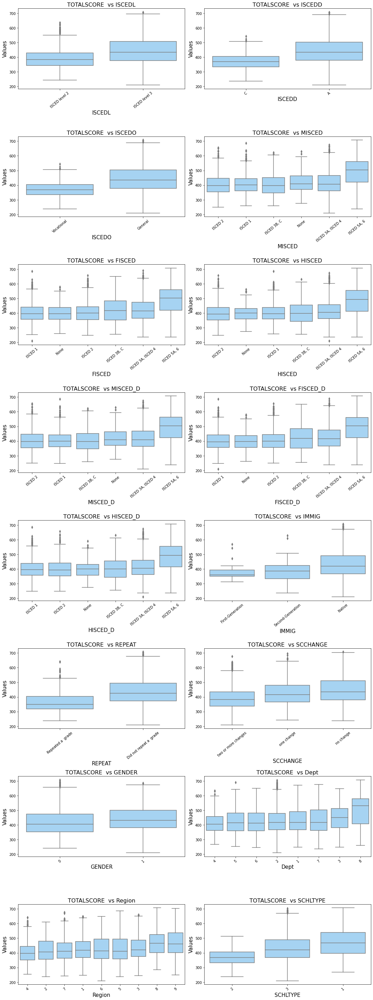

In [36]:
obvar = train_thailand.dtypes =="object"
categorical_features = list(obvar[obvar].index) 
subplot_boxplot(train_thailand, categorical_features)

In [37]:
train_thailand.drop(columns=['MISCED_D', 'FISCED_D', 'HISCED_D', 'ISCEDD' ], axis =1, inplace = True)
test_thailand.drop(columns=['MISCED_D', 'FISCED_D', 'HISCED_D', 'ISCEDD'], axis =1, inplace = True)

In [38]:
# grouping values of categorical columns to reduce number of categories. 
train_thailand['Is_MISCED_5A,6'] = np.where(train_thailand['MISCED'] == 'ISCED 5A, 6', 1, 0)
train_thailand['Is_FISCED_5A,6'] = np.where(train_thailand['FISCED'] == 'ISCED 5A, 6', 1, 0)
train_thailand['Is_HISCED_5A,6'] = np.where(train_thailand['HISCED'] == 'ISCED 5A, 6', 1, 0)

In [39]:
# grouping values of categorical columns to reduce number of categories. 
test_thailand['Is_MISCED_5A,6'] = np.where(test_thailand['MISCED'] == 'ISCED 5A, 6', 1, 0)
test_thailand['Is_FISCED_5A,6'] = np.where(test_thailand['FISCED'] == 'ISCED 5A, 6', 1, 0)
test_thailand['Is_HISCED_5A,6'] = np.where(test_thailand['HISCED'] == 'ISCED 5A, 6', 1, 0)

In [40]:
#drop original columns
train_thailand.drop(columns= ['MISCED', 'FISCED', 'HISCED'], axis =1, inplace =True)
test_thailand.drop(columns= ['MISCED', 'FISCED', 'HISCED'], axis =1, inplace =True)

In [41]:
train_thailand_cormatrix = train_thailand.drop(columns= ['MATH','SCIENCE','READ','TOTALSCORE',], axis =1)

<AxesSubplot:>

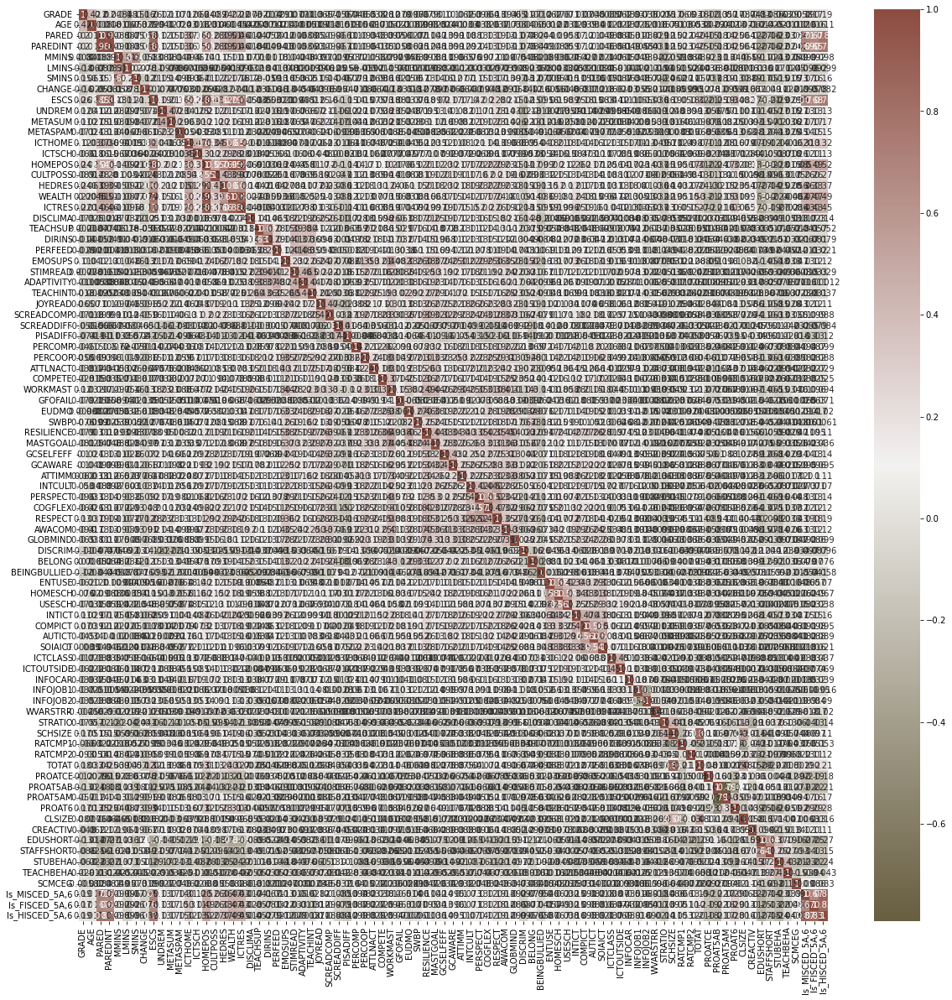

In [42]:
#Checking collinearity using correlation matrix
cmap = sns.diverging_palette(70,20,s=50, l=40, n=6,as_cmap=True)
corrmat= train_thailand_cormatrix.corr()
f, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corrmat,cmap=cmap,annot=True, )

In [43]:
# Drop columns with high correlation 
#Create correlation matrix
corr_matrix = train_thailand_cormatrix.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]
print(to_drop)

['PAREDINT', 'WEALTH']


In [44]:
# Drop features 
train_thailand.drop(to_drop, axis=1, inplace=True)
test_thailand.drop(to_drop, axis=1, inplace=True)
train_thailand.shape, test_thailand.shape

((6775, 96), (1727, 96))

In [45]:
#Exploring target variables

In [46]:
train_thailand[['MATH','READ', 'SCIENCE','TOTALSCORE']].describe().round(2)

,MATH,READ,SCIENCE,TOTALSCORE
count,6775.00,6775.00,6775.00,6775.00
mean,439.87,410.48,445.49,431.95
std,94.21,85.92,86.78,85.67
min,152.93,204.76,192.08,210.01
25%,369.89,346.09,380.32,367.62
50%,426.96,401.22,436.46,419.66
75%,498.87,469.08,506.19,489.41
max,772.24,681.54,705.10,707.02


<Figure size 432x432 with 0 Axes>

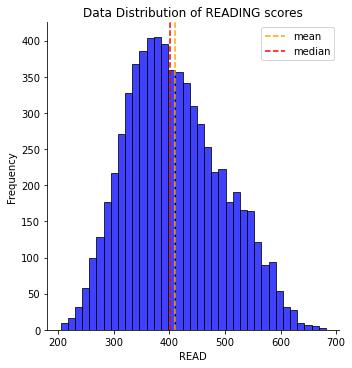

In [47]:
#checking Data Distribution of READING scores
plt.figure(figsize=(6,6))

sns.displot(train_thailand['READ'], color='b')

plt.ylabel('Frequency')

plt.title('Data Distribution of READING scores')

plt.axvline(train_thailand['READ'].mean(), linestyle = '--', color = 'orange', label ='mean')

plt.axvline(train_thailand['READ'].median(), linestyle = '--', color = 'r', label ='median')

plt.legend();


<Figure size 432x432 with 0 Axes>

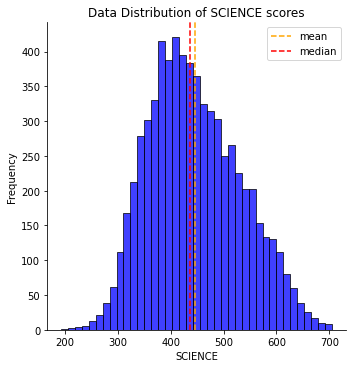

In [48]:
#checking Data Distribution of SCIENCE scores
plt.figure(figsize=(6,6))

sns.displot(train_thailand['SCIENCE'], color='b')

plt.ylabel('Frequency')

plt.title('Data Distribution of SCIENCE scores')

plt.axvline(train_thailand['SCIENCE'].mean(), linestyle = '--', color = 'orange', label ='mean')

plt.axvline(train_thailand['SCIENCE'].median(), linestyle = '--', color = 'r', label ='median')

plt.legend();

<Figure size 432x432 with 0 Axes>

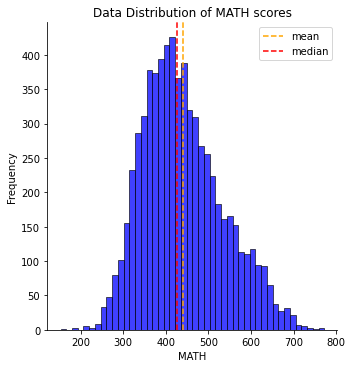

In [49]:
#checking Data Distribution of MATH scores
plt.figure(figsize=(6,6))

sns.displot(train_thailand['MATH'], color='b')

plt.ylabel('Frequency')

plt.title('Data Distribution of MATH scores')

plt.axvline(train_thailand['MATH'].mean(), linestyle = '--', color = 'orange', label ='mean')

plt.axvline(train_thailand['MATH'].median(), linestyle = '--', color = 'r', label ='median')

plt.legend();

<Figure size 432x432 with 0 Axes>

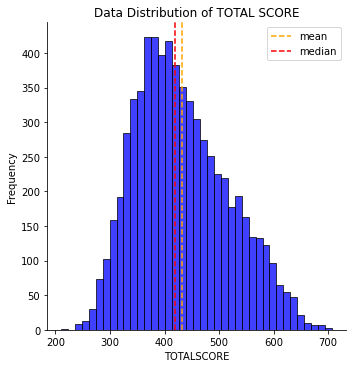

In [50]:
#checking Data Distribution of TOTAL scores
plt.figure(figsize=(6,6))

sns.displot(train_thailand['TOTALSCORE'], color='b')

plt.ylabel('Frequency')

plt.title('Data Distribution of TOTAL SCORE')

plt.axvline(train_thailand['TOTALSCORE'].mean(), linestyle = '--', color = 'orange', label ='mean')

plt.axvline(train_thailand['TOTALSCORE'].median(), linestyle = '--', color = 'r', label ='median')

plt.legend();

In [51]:
#Exploring features with high correlation wiht target variable

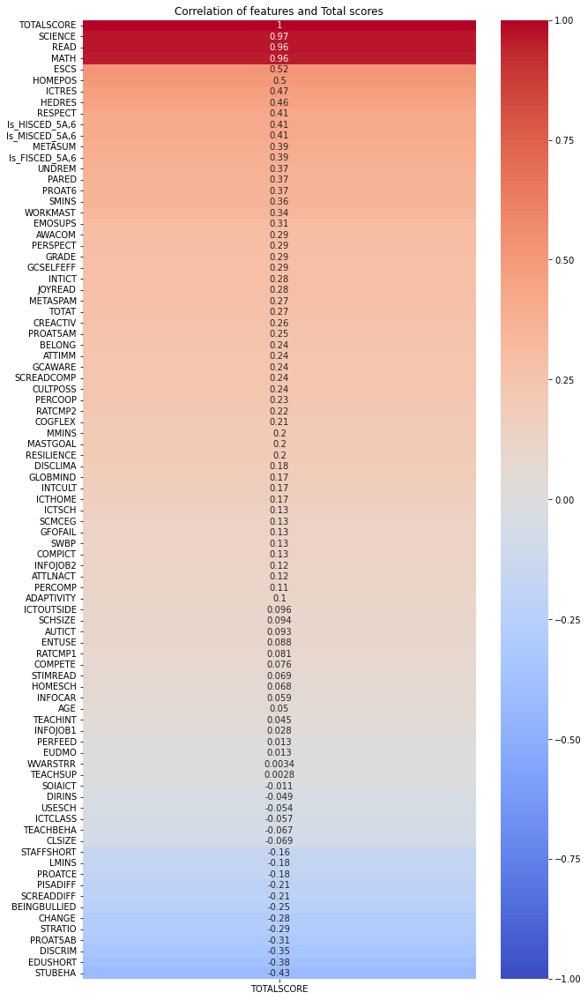

In [52]:
plt.figure(figsize = (10,20))
sns.heatmap(train_thailand.corr()[['TOTALSCORE']].sort_values(by = 'TOTALSCORE', ascending = False), 
                cmap = 'coolwarm',
                vmax = 1,
                vmin = -1,
                annot = True)
plt.title('Correlation of features and Total scores')

plt.yticks(rotation =0)
plt.show()

In [53]:
selectd_features = (train_thailand.corr()[['TOTALSCORE']] > 0.25) | (train_thailand.corr()[['TOTALSCORE']] <= -0.25)
selectd_features[selectd_features['TOTALSCORE']==True].index.values

array(['GRADE', 'PARED', 'SMINS', 'CHANGE', 'ESCS', 'UNDREM', 'METASUM',
       'METASPAM', 'HOMEPOS', 'HEDRES', 'ICTRES', 'EMOSUPS', 'JOYREAD',
       'WORKMAST', 'GCSELFEFF', 'PERSPECT', 'RESPECT', 'AWACOM',
       'DISCRIM', 'INTICT', 'MATH', 'SCIENCE', 'READ', 'TOTALSCORE',
       'STRATIO', 'TOTAT', 'PROAT5AB', 'PROAT5AM', 'PROAT6', 'CREACTIV',
       'EDUSHORT', 'STUBEHA', 'Is_MISCED_5A,6', 'Is_FISCED_5A,6',
       'Is_HISCED_5A,6'], dtype=object)

In [54]:
train_thailand.to_csv('train_pisa2018_thailand.csv')
test_thailand.to_csv('test_pisa2018_thailand.csv')

In [55]:
#Assemble our X (numeric) and y variables
X_train =train_thailand[['GRADE','PARED', 'SMINS', 'CHANGE', 'ESCS', 'UNDREM', 'METASUM',
       'METASPAM', 'HOMEPOS', 'HEDRES', 'ICTRES', 'EMOSUPS', 'JOYREAD',
       'WORKMAST', 'GCSELFEFF', 'PERSPECT', 'RESPECT', 'AWACOM',
       'DISCRIM', 'INTICT', 'STRATIO', 'TOTAT', 'PROAT5AB', 'PROAT5AM', 'PROAT6',
       'CREACTIV', 'EDUSHORT', 'STUBEHA']]
y_train = train_thailand['TOTALSCORE']
                        
X_test =test_thailand[['GRADE','PARED', 'SMINS', 'CHANGE', 'ESCS', 'UNDREM', 'METASUM',
       'METASPAM', 'HOMEPOS', 'HEDRES', 'ICTRES', 'EMOSUPS', 'JOYREAD',
       'WORKMAST', 'GCSELFEFF', 'PERSPECT', 'RESPECT', 'AWACOM',
       'DISCRIM', 'INTICT', 'STRATIO', 'TOTAT', 'PROAT5AB', 'PROAT5AM', 'PROAT6',
       'CREACTIV', 'EDUSHORT', 'STUBEHA']]
y_test = test_thailand['TOTALSCORE']    
                      
lr = LinearRegression()
lr.fit(X_train, y_train)

# Train Score
lr.score(X_train, y_train)
print(f'Train R-squared Score: {lr.score(X_train, y_train)}')
print()

# Test Score
lr.score(X_test, y_test)
print(f'Test R-squared Score: {lr.score(X_test, y_test)}')

# Cross Val Score
cross_val_score(lr, X_train, y_train, cv =5)
print(f' Cross Val Score :{cross_val_score(lr, X_train, y_train, cv =5)}')
print()
# Making prediction
y_preds = lr.predict(X_test)

#evaluate models with matrics
print(f'MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}' )


Train R-squared Score: 0.6307112616125983

Test R-squared Score: 0.5592122366981489
 Cross Val Score :[0.6147932  0.62580011 0.61631868 0.64915894 0.62862682]

MSE is : 3156.335695055159
RMSE is : 56.18127530641467


In [56]:
#Assemble our X and y variables
X_train =train_thailand[['PARED', 'SMINS', 'CHANGE', 'ESCS', 'UNDREM', 'METASUM',
       'METASPAM', 'HOMEPOS', 'HEDRES', 'ICTRES', 'EMOSUPS', 'JOYREAD',
       'WORKMAST', 'GCSELFEFF', 'PERSPECT', 'RESPECT', 'AWACOM',
       'DISCRIM', 'INTICT', 'STRATIO', 'TOTAT', 'PROAT5AB', 'PROAT5AM', 'PROAT6',
       'CREACTIV', 'EDUSHORT', 'STUBEHA', 'Is_MISCED_5A,6',
       'Is_FISCED_5A,6', 'ISCEDL','ISCEDO', 'IMMIG', 'REPEAT', 'SCCHANGE', 'GENDER','Dept', 'Region','SCHLTYPE', 'GRADE']]
X_train = pd.get_dummies(columns=[ 'Is_MISCED_5A,6','Is_FISCED_5A,6', 'ISCEDL','ISCEDO', 'IMMIG', 'REPEAT',
                                  'SCCHANGE', 'GENDER','Dept', 'Region','SCHLTYPE'], drop_first =True, data =X_train)
y_train = train_thailand['TOTALSCORE']

X_test =test_thailand[['PARED', 'SMINS', 'CHANGE', 'ESCS', 'UNDREM', 'METASUM',
       'METASPAM', 'HOMEPOS', 'HEDRES', 'ICTRES', 'EMOSUPS', 'JOYREAD',
       'WORKMAST', 'GCSELFEFF', 'PERSPECT', 'RESPECT', 'AWACOM',
       'DISCRIM', 'INTICT', 'STRATIO', 'TOTAT', 'PROAT5AB', 'PROAT5AM', 'PROAT6',
       'CREACTIV', 'EDUSHORT', 'STUBEHA', 'Is_MISCED_5A,6',
       'Is_FISCED_5A,6', 'ISCEDL','ISCEDO', 'IMMIG', 'REPEAT', 'SCCHANGE', 'GENDER','Dept', 'Region','SCHLTYPE', 'GRADE']]
X_test = pd.get_dummies(columns=[ 'Is_MISCED_5A,6','Is_FISCED_5A,6', 'ISCEDL','ISCEDO', 'IMMIG', 'REPEAT', 'SCCHANGE', 
                                 'GENDER','Dept', 'Region','SCHLTYPE'], drop_first =True, data =X_test)
y_test = test_thailand['TOTALSCORE']

In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)


In [57]:
from sklearn.dummy import DummyRegressor
baseline_model = DummyRegressor()
baseline_model.fit(X_train, y_train)
baseline_preds = baseline_model.predict(X_test)
# Test Score
baseline_model.score(X_test, y_test)
print(f'Test R-squared Score: {baseline_model.score(X_test, y_test)}')
#evaluate models with matrics
print(f'MSE is : {mean_squared_error(y_test, baseline_preds)}' )
print(f'RMSE is : {mean_squared_error(y_test, baseline_preds, squared = False)}' )

Test R-squared Score: -0.0010390229006635998
MSE is : 7168.110059264057
RMSE is : 84.66469192800537


In [58]:
#scaler = StandardScaler()  #scaler object
#X_train_sc = scaler.fit_transform(X_train)  #scaling training set
#X_test_sc = scaler.transform(X_test)  #scaling test set


lr = LinearRegression()
lr.fit(X_train, y_train)

# Train Score
lr.score(X_train, y_train)
print(f'Train R-squared Score: {lr.score(X_train, y_train)}')
print()

# Test Score
lr.score(X_test, y_test)
print(f'Test R-squared Score: {lr.score(X_test, y_test)}')

# Cross Val Score
cross_val_score(lr, X_train, y_train, cv =5)
print(f' Cross Val Score :{cross_val_score(lr, X_train, y_train, cv =5)}')
print()
# Making prediction
y_preds = lr.predict(X_test)

#evaluate models with matrics
print(f'MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}' )

Train R-squared Score: 0.6540393396680027

Test R-squared Score: 0.5797457279110029
 Cross Val Score :[0.63048904 0.64877069 0.64281842 0.66302882 0.64916462]

MSE is : 3009.3021413699353
RMSE is : 54.85710657125415


In [59]:
lr.intercept_

519.2189745831064

In [60]:
pd.Series(lr.coef_, index = X_train.columns).sort_values(ascending=False)

PROAT6                          253.286513
ESCS                             17.007886
GRADE                            16.104382
Dept_8                           13.847995
Region_5                         11.780859
Is_MISCED_5A,6_1                 11.042731
Region_8                          8.468575
SCHLTYPE_3                        8.386131
Region_9                          8.340430
Is_FISCED_5A,6_1                  8.106091
METASUM                           8.028456
RESPECT                           7.425094
ICTRES                            7.069986
METASPAM                          7.007089
UNDREM                            6.999851
INTICT                            5.768924
GCSELFEFF                         4.921570
WORKMAST                          4.646635
CREACTIV                          3.802726
HEDRES                            3.357585
JOYREAD                           3.343648
AWACOM                            1.821601
GENDER_1                          1.394359
TOTAT      

In [61]:
# Set up a list of Lasso alphas to check.
l_alphas =np.logspace(-3,0,100)
# Cross-validate over our list of Lasso alphas.
lasso_cv = LassoCV(alphas = l_alphas )
# Fit model using best alpha!
lasso_cv.fit(X_train, y_train)

LassoCV(alphas=array([0.001     , 0.00107227, 0.00114976, 0.00123285, 0.00132194,
       0.00141747, 0.00151991, 0.00162975, 0.00174753, 0.00187382,
       0.00200923, 0.00215443, 0.00231013, 0.00247708, 0.00265609,
       0.00284804, 0.00305386, 0.00327455, 0.00351119, 0.00376494,
       0.00403702, 0.00432876, 0.00464159, 0.00497702, 0.0053367 ,
       0.00572237, 0.00613591, 0.00657933, 0.0070548 , 0.00756463,
       0.008...
       0.09326033, 0.1       , 0.10722672, 0.1149757 , 0.12328467,
       0.13219411, 0.14174742, 0.15199111, 0.16297508, 0.17475284,
       0.18738174, 0.2009233 , 0.21544347, 0.23101297, 0.24770764,
       0.26560878, 0.28480359, 0.30538555, 0.32745492, 0.35111917,
       0.37649358, 0.40370173, 0.43287613, 0.46415888, 0.49770236,
       0.53366992, 0.57223677, 0.61359073, 0.65793322, 0.70548023,
       0.75646333, 0.81113083, 0.869749  , 0.93260335, 1.        ]))

In [62]:
print(lasso_cv.score(X_train, y_train))
print(lasso_cv.score(X_test, y_test))

0.6537908243114128
0.5811021616637617


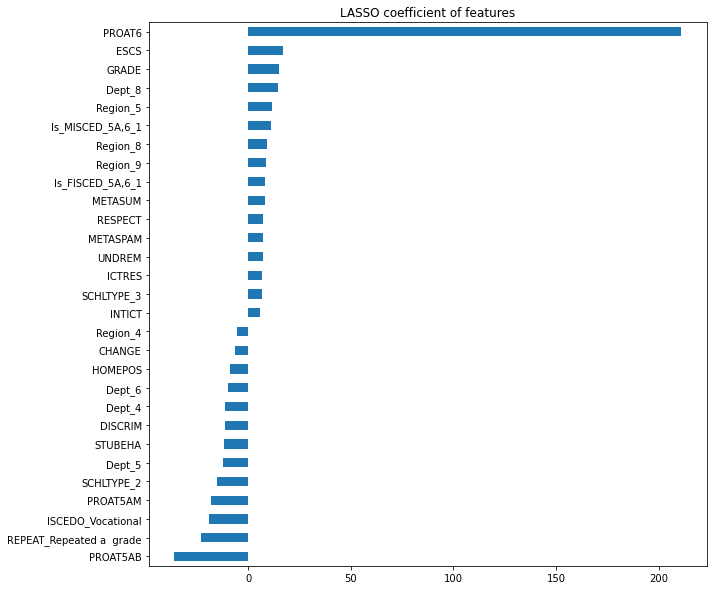

In [63]:
lasso_coefs = lasso_cv.coef_
lasso_coefs = pd.Series(lasso_coefs, X_train.columns)
plt.figure(figsize = (10,10))
plt.title('LASSO coefficient of features')
lasso_coefs[(lasso_coefs >5.0) | (lasso_coefs <-5.0)].sort_values(ascending = True).plot.barh();

In [64]:
scaler = StandardScaler()  #scaler object
X_train_sc = scaler.fit_transform(X_train)  #scaling training set
X_test_sc = scaler.transform(X_test)  #scaling test set

lr = LinearRegression()
lr.fit(X_train_sc, y_train)
y_preds = lr.predict(X_test_sc)

In [65]:
# coefficient dataframe
lr_coef = pd.DataFrame(data=[lr.coef_],columns=X_train.columns).T.sort_values(by=0,ascending=False)

# Label the color the each coefficient
color = ['red' if x < 0 else 'blue' for x in lr_coef[0]]

# Assign the color_list to new column
lr_coef['color'] = color

lr_coef.head()

,0,color
ESCS,21.135973,blue
SMINS,8.332472,blue
GRADE,7.940278,blue
PROAT6,7.691418,blue
METASUM,7.525486,blue


In [66]:
# Select the highest values whether negative or positive
abs(lr_coef[0]).sort_values(ascending=False)[:10].index

Index(['ESCS', 'PARED', 'STUBEHA', 'HOMEPOS', 'DISCRIM', 'PROAT5AB', 'SMINS',
       'GRADE', 'PROAT6', 'METASUM'],
      dtype='object')

Text(0.5, 1.0, 'Top 10 highest coefficient')

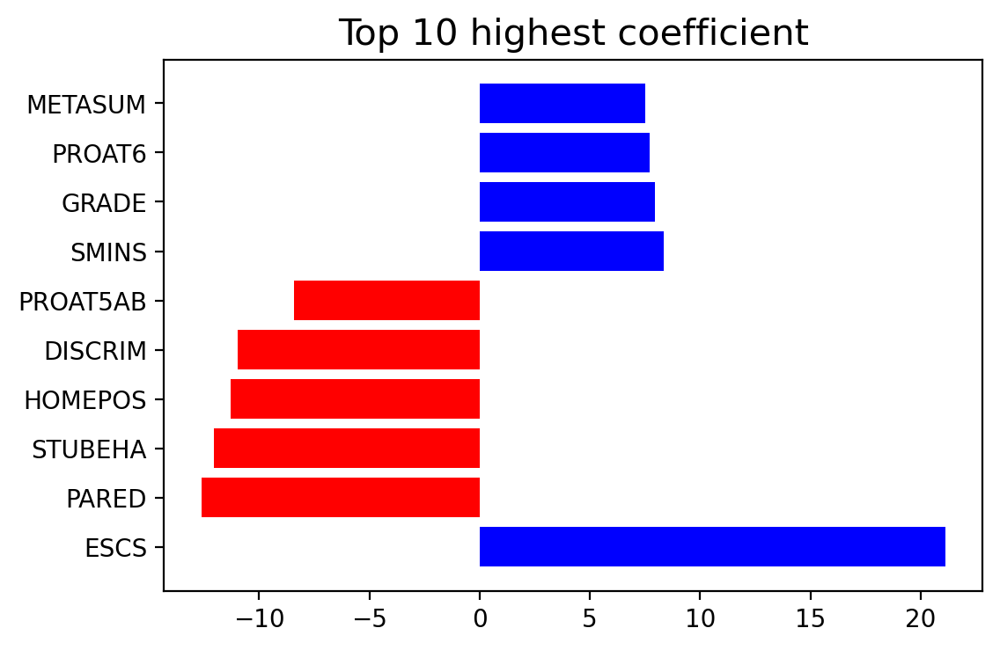

In [67]:
# Plot the coefficient of top 10 highest coefficient 
plt.figure(dpi=200)
plt.barh(lr_coef.loc[['ESCS', 'PARED', 'STUBEHA', 'HOMEPOS', 'DISCRIM', 'PROAT5AB', 'SMINS',
       'GRADE', 'PROAT6', 'METASUM']].index,lr_coef.loc[['ESCS', 'PARED', 'STUBEHA', 'HOMEPOS', 'DISCRIM', 'PROAT5AB', 'SMINS',
       'GRADE', 'PROAT6', 'METASUM']][0],color=lr_coef.loc[['ESCS', 'PARED', 'STUBEHA', 'HOMEPOS', 'DISCRIM', 'PROAT5AB', 'SMINS',
       'GRADE', 'PROAT6', 'METASUM']]['color'])
plt.title('Top 10 highest coefficient',size=15)

In [68]:
#RandomForestRegressor
RFReg = RandomForestRegressor(max_depth = 4, random_state = 0).fit(X_train, y_train)
# Train Score
RFReg.score(X_train, y_train)
print(f'RFReg Train R-squared Score: {RFReg.score(X_train, y_train)}')
print()

# Test Score
RFReg.score(X_test, y_test)
print(f'RFReg Test R-squared Score: {RFReg.score(X_test, y_test)}')

# Cross Val Score
cross_val_score(RFReg, X_train, y_train, cv =5)
print(f'RFReg Cross Val Score :{cross_val_score(RFReg, X_train, y_train, cv =5)}')
print()
# Making prediction
y_preds = RFReg.predict(X_test)

#evaluate models with matrics
print(f'RFReg MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'RFReg RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}' )

RFReg Train R-squared Score: 0.5748765900237438

RFReg Test R-squared Score: 0.5132836843758802
RFReg Cross Val Score :[0.55189986 0.57563722 0.5544735  0.54901509 0.55859677]

RFReg MSE is : 3485.214899938423
RFReg RMSE is : 59.03570868498508


In [69]:
parameters = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [2,3,4],
}
regr = RandomForestRegressor(random_state=42)

clf = GridSearchCV(regr, parameters)
clf.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestRegressor(random_state=42),
             param_grid={'max_depth': [2, 3, 4],
                         'n_estimators': [100, 150, 200, 250, 300]})

In [70]:
clf.best_params_

{'max_depth': 4, 'n_estimators': 300}

In [71]:
clf.score(X_train, y_train)

0.5756780463239448

In [72]:
# Making prediction
y_preds_clf = clf.predict(X_test)

#evaluate models with matrics
print(f'RFReg MSE is : {mean_squared_error(y_test, y_preds_clf)}' )
print(f'RFReg RMSE is : {mean_squared_error(y_test, y_preds_clf, squared = False)}' )

RFReg MSE is : 3465.215674816831
RFReg RMSE is : 58.866082550283835


In [73]:
clf.best_estimator_

RandomForestRegressor(max_depth=4, n_estimators=300, random_state=42)

In [74]:
pd.DataFrame(clf.cv_results_).sort_values('rank_test_score').head(5)[['params','param_max_depth','mean_test_score']]

,params,param_max_depth,mean_test_score
14,"{'max_depth': 4, 'n_estimators': 300}",4,0.556699
13,"{'max_depth': 4, 'n_estimators': 250}",4,0.556684
11,"{'max_depth': 4, 'n_estimators': 150}",4,0.556631
12,"{'max_depth': 4, 'n_estimators': 200}",4,0.556568
10,"{'max_depth': 4, 'n_estimators': 100}",4,0.556128


In [75]:
scaler = StandardScaler()

X_train_sc = scaler.fit_transform(X_train)

X_test_sc = scaler.transform(X_test)

#SVM
SVM = svm.SVR().fit(X_train_sc, y_train)
# Train Score
SVM.score(X_train_sc, y_train)
print(f'SVM Train R-squared Score: {SVM.score(X_train_sc, y_train)}')
print()

# Test Score
SVM.score(X_test_sc, y_test)
print(f'SVM Test R-squared Score: {SVM.score(X_test_sc, y_test)}')

# Cross Val Score
cross_val_score(SVM, X_train_sc, y_train, cv =5)
print(f'SVM Cross Val Score :{cross_val_score(SVM, X_train_sc, y_train, cv =5)}')
print()
# Making prediction
y_preds = SVM.predict(X_test_sc)

#evaluate SVMs with matrics
print(f'SVM MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'SVM RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}' )

SVM Train R-squared Score: 0.5796009814557042

SVM Test R-squared Score: 0.5829811545803893
SVM Cross Val Score :[0.53942625 0.53393992 0.55832372 0.54891316 0.55124313]

SVM MSE is : 2986.1343188132896
SVM RMSE is : 54.645533383921595


In [76]:
#scaler = StandardScaler()

#X_train_sc = scaler.fit_transform(X_train)

#X_test_sc = scaler.transform(X_test)

#XGRegressor
XGReg = xg.XGBRegressor(objective ='reg:squarederror', max_depth = 3, seed = 1,verbosity=0).fit(X_train, y_train) 
# Train Score
XGReg.score(X_train, y_train)
print(f'XGReg Train R-squared Score: {XGReg.score(X_train, y_train)}')
print()

# Test Score
XGReg.score(X_test, y_test)
print(f'XGReg Test R-squared Score: {XGReg.score(X_test, y_test)}')

# Cross Val Score
cross_val_score(XGReg, X_train, y_train, cv =5)
print(f'XGReg Cross Val Score :{cross_val_score(XGReg, X_train, y_train, cv =5)}')
print()
# Making prediction
y_preds = XGReg.predict(X_test)

#evaluate models with matrics
print(f'XGReg MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'XGReg RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}' )

XGReg Train R-squared Score: 0.8053948733510827

XGReg Test R-squared Score: 0.6940802348478923
XGReg Cross Val Score :[0.72251986 0.73245702 0.69231749 0.72014743 0.72965689]

XGReg MSE is : 2190.5904722478804
XGReg RMSE is : 46.803744211845704


In [77]:
#scaling 
#XGReg Train R-squared Score: 0.8062091261552633

#XGReg Test R-squared Score: 0.7036807027713595
#XGReg Cross Val Score :[0.71167068 0.73181853 0.70530674 0.72293502 0.73317806]

#XGReg MSE is : 2121.8446899941187
#XGReg RMSE is : 46.063485430372275

In [78]:
xgb1 = XGBRegressor()
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07], #so called `eta` value
              'max_depth': [2,3,4,5],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}

xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True)

xgb_grid.fit(X_train,y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Fitting 2 folds for each of 12 candidates, totalling 24 fits
[11:20:38] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[11:20:38] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "silent" } are not used.

0.7265182690627591
{'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}


In [79]:
pd.DataFrame(xgb_grid.cv_results_).sort_values('rank_test_score').head(5)[['params','param_max_depth','mean_test_score']]

,params,param_max_depth,mean_test_score
6,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",4,0.726518
3,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",5,0.725773
7,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",5,0.725723
2,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",4,0.723134
9,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",3,0.722493


In [80]:
#XGRegressor
XGReg2 = xg.XGBRegressor(learning_rate = 0.03, max_depth = 4, min_child_weight = 4, n_estimators = 500, nthread = 4, \
                         objective = 'reg:linear', subsample = 0.7, seed = 1, verbosity=0).fit(X_train, y_train) 
# Train Score
XGReg2.score(X_train, y_train)
print(f'XGReg2 Train R-squared Score: {XGReg2.score(X_train, y_train)}')
print()

# Test Score
XGReg2.score(X_test, y_test)
print(f'XGReg2 Test R-squared Score: {XGReg2.score(X_test, y_test)}')

# Cross Val Score
cross_val_score(XGReg2, X_train, y_train, cv =5)
print(f'XGReg2 Cross Val Score :{cross_val_score(XGReg2, X_train, y_train, cv =5)}')
print()
# Making prediction
y_preds = XGReg2.predict(X_test)

#evaluate models with matrics
print(f'XGReg2 MSE is : {mean_squared_error(y_test, y_preds)}' )
print(f'XGReg2 RMSE is : {mean_squared_error(y_test, y_preds, squared = False)}')

XGReg2 Train R-squared Score: 0.8210699751762103

XGReg2 Test R-squared Score: 0.7114248951642426
XGReg2 Cross Val Score :[0.73115211 0.73982776 0.71799165 0.73759387 0.74282755]

XGReg2 MSE is : 2066.3910841681954
XGReg2 RMSE is : 45.45757455219312


In [81]:
# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(XGReg2)
shap_values = explainer.shap_values(X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [82]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_test.iloc[0,:])

 99%|===================| 6735/6775 [00:51<00:00]        

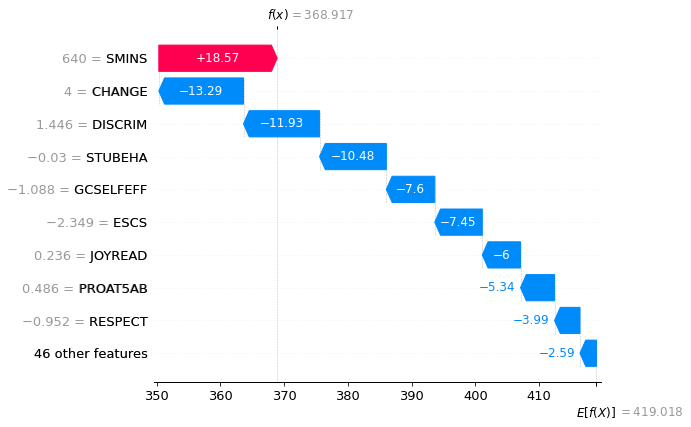

In [83]:
explainer = shap.Explainer(XGReg2, X_train)
shap_values = explainer(X_train)
shap.plots.waterfall(shap_values[100])

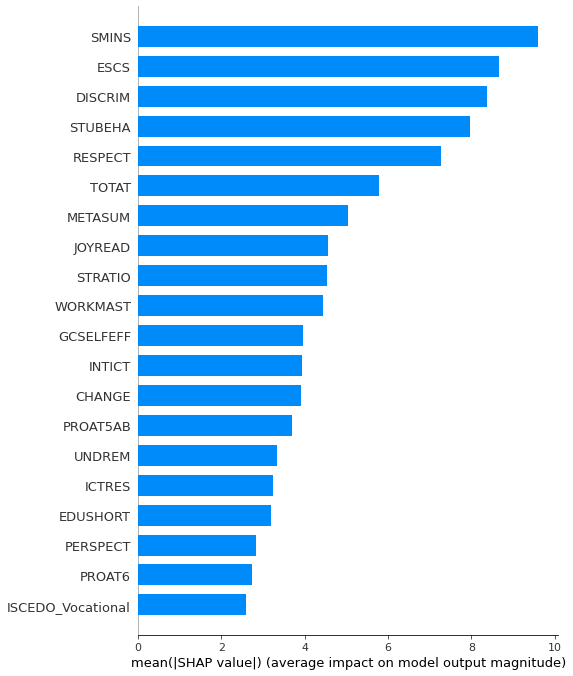

In [86]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

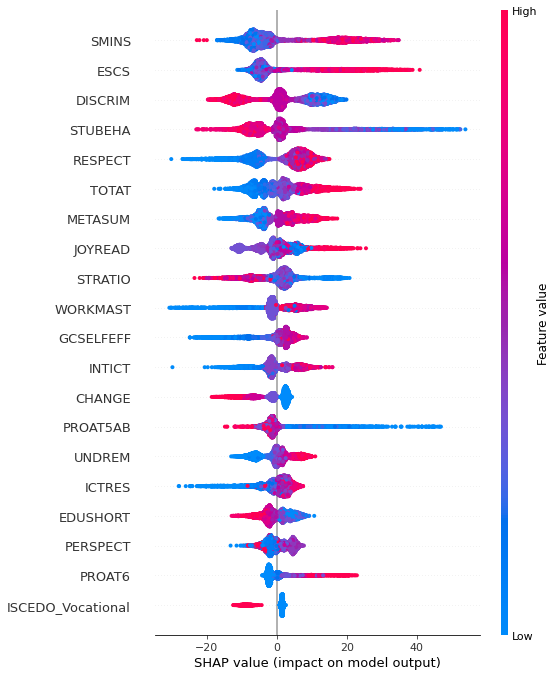

In [87]:
shap.summary_plot(shap_values, X_train)

C:\Users\science01\Anaconda3\lib\site-packages\sklearn\inspection\_plot\partial_dependence.py:1448: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\science01\Anaconda3\lib\site-packages\sklearn\inspection\_plot\partial_dependence.py:1197: UserWarning:

Attempting to set identical bottom == top == 431.9521179199219 results in singular transformations; automatically expanding.

C:\Users\science01\Anaconda3\lib\site-packages\sklearn\inspection\_plot\partial_dependence.py:1197: UserWarning:

Attempting to set identical bottom == top == 431.9521179199219 results in singular transformations; automatically expanding.

C:\Users\science01\Anaconda3\lib\site-packages\sklearn\inspection\_plot\partial_dependence.py:1197: UserWarning:

Attempting to set identical bottom 

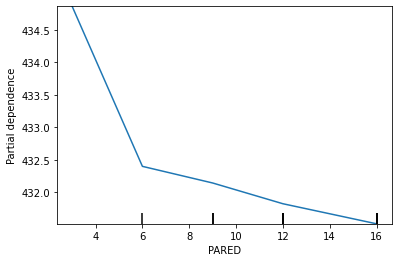

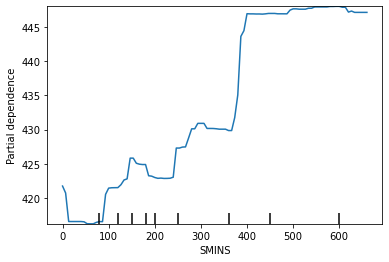

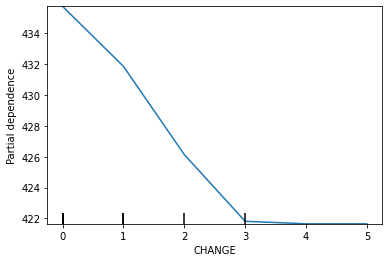

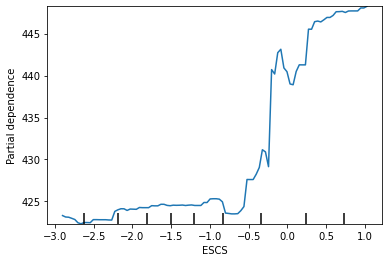

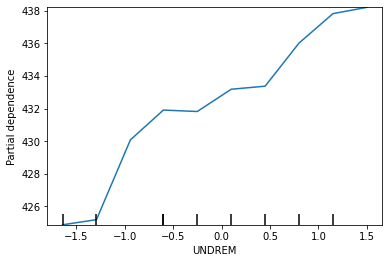

...

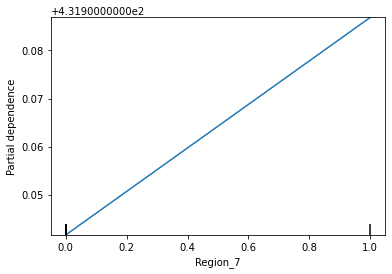

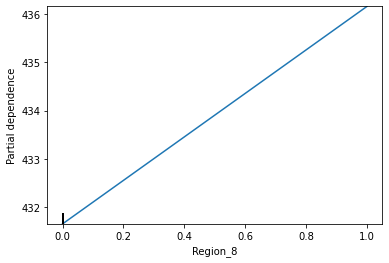

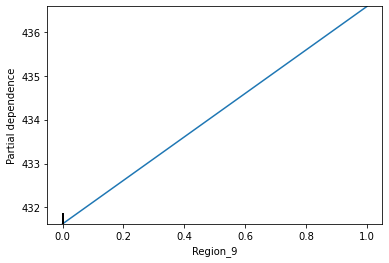

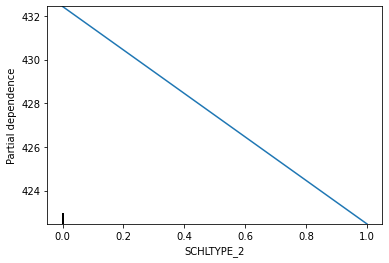

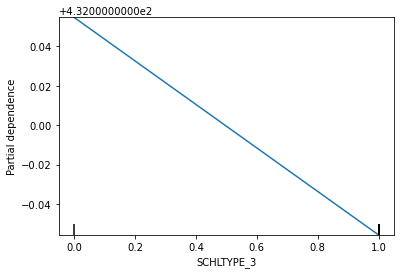

In [112]:
from sklearn.inspection import PartialDependenceDisplay
for cols_name in X_train.columns:
    PartialDependenceDisplay.from_estimator(XGReg2, X_train, [cols_name]);

In [92]:
#interpretml 
from interpret import show
from interpret.data import Marginal
from interpret.glassbox import ExplainableBoostingRegressor, LinearRegression
from interpret.perf import RegressionPerf

In [93]:
lg = LinearRegression(random_state=42)
lg.fit(X_train, y_train)

lg_global = lg.explain_global()
show(lg_global)


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`

The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

The dash_table package is deprecated. Please replace
`import dash_table` with `from dash import dash_table`

Also, if you're using any of the table format helpers (e.g. Group), replace 
`from dash_table.Format import Group` with 
`from dash.dash_table.Format import Group`


<!-- http://127.0.0.1:7145/2456539412656/ -->

In [94]:
lg_perf = RegressionPerf(lg.predict).explain_perf(X_test, y_test, name='LinearRegression')
show(lg_perf)

<!-- http://127.0.0.1:7145/2454996781328/ -->

In [95]:
ebm = ExplainableBoostingRegressor(random_state=42, n_jobs=-1, feature_names = X_train.columns)
ebm.fit(X_train, y_train) 

ExplainableBoostingRegressor(feature_names=['PARED', 'SMINS', 'CHANGE', 'ESCS',
                                            'UNDREM', 'METASUM', 'METASPAM',
                                            'HOMEPOS', 'HEDRES', 'ICTRES',
                                            'EMOSUPS', 'JOYREAD', 'WORKMAST',
                                            'GCSELFEFF', 'PERSPECT', 'RESPECT',
                                            'AWACOM', 'DISCRIM', 'INTICT',
                                            'STRATIO', 'TOTAT', 'PROAT5AB',
                                            'PROAT5AM', 'PROAT6', 'CREACTIV',
                                            'EDUSHORT', 'STUBEHA', 'GRADE',
                                            'Is_MISCED_5A,6_1',
                                            'Is_FISCED_5A,6_...
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'categorical', 'categorical', ...],
                             n_jobs=-1)

In [96]:
ebm_global = ebm.explain_global(name='EBM')
show(ebm_global)

<!-- http://127.0.0.1:7145/2454958148816/ -->

In [97]:
ebm_perf = RegressionPerf(ebm.predict).explain_perf(X_test, y_test, name='EBM')
show(ebm_perf)

<!-- http://127.0.0.1:7145/2456679862384/ -->

In [104]:
pdp = PartialDependence(predict_fn=ebm.predict, data=X_train)
pdp_global = pdp.explain_global()

show(pdp_global)